<a href="https://colab.research.google.com/github/mhlaghari/portfolio/blob/main/ComputerVision_FaceDetection1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Face and Object Detection Project

This project is to demonstrate computer vision using Open CV in Python

This project consists of

*   Section 1: Preprocessing
*   Section 2: Haarcascade Algorithm

>   Section 2.1: Face Detection  
>>  Section 2.1.1: Eye Detection 

>   Section 2.2: Object Detection
>>  Section 2.2.1: Car Detetection  
>>  Section 2.2.2: Clock Detection

> Section 2.3: Full Body Detection

*   Section 3: Histogram of Oriented Gradients (HOG) algorithm

*   Section 4: Convolutional Neural Networks (CNN) algorithm
*   Section 5: Haarcascade vs HOG vs CNN

> Section 5.1: Haarcascade

> Section 5.2: HOG

> Section 5.3: CNN

*   Section 6: Conclusion


linkedin: https://www.linkedin.com/in/mhlaghari

email: mhlaghari@gmail.com



**Section 1: Preprocessing and Preparation**

In [1]:
#importing cv2 library
import cv2

In [2]:
#setting directory
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
#Loading Image
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people1.jpg')

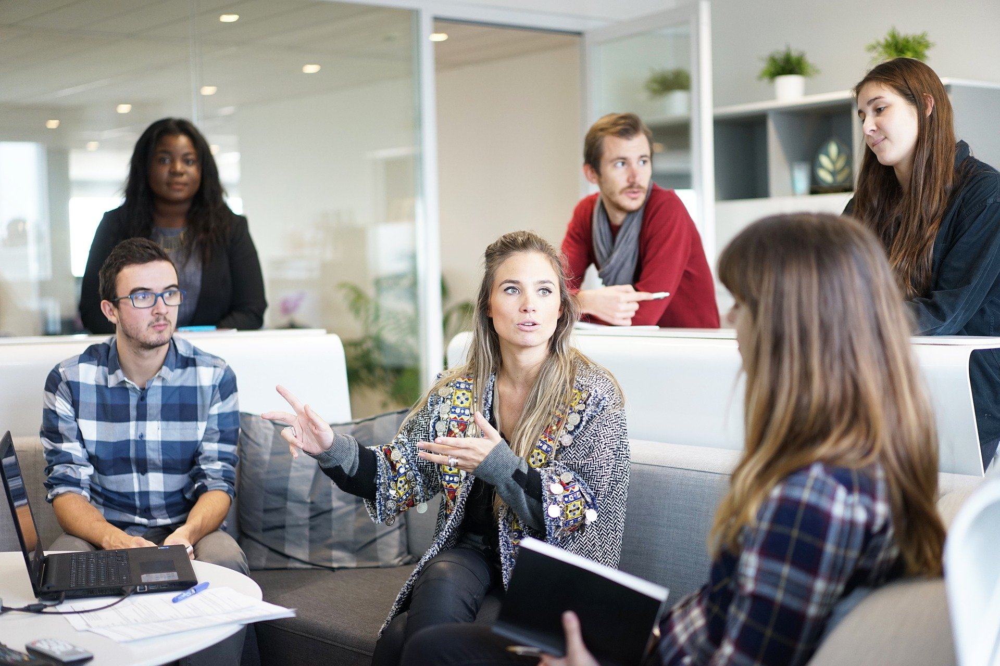

In [5]:

from google.colab.patches import cv2_imshow
cv2_imshow(image)

In [6]:
image = cv2.resize(image, (1000,800))
image.shape

(800, 1000, 3)

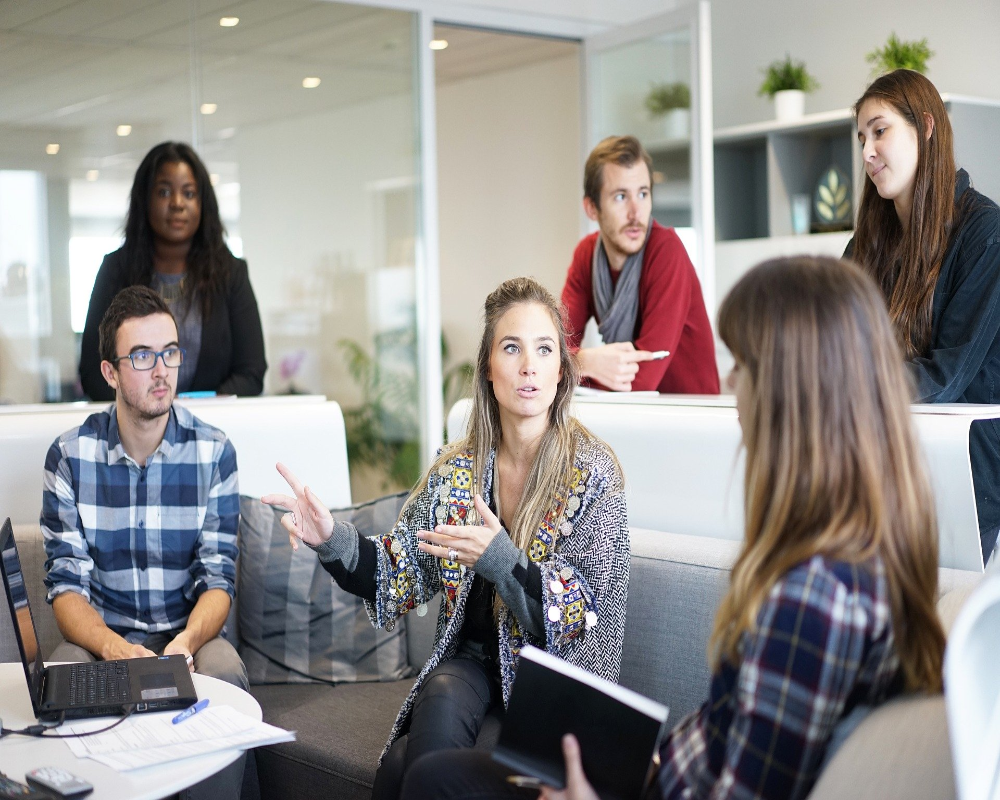

In [7]:
cv2_imshow(image)

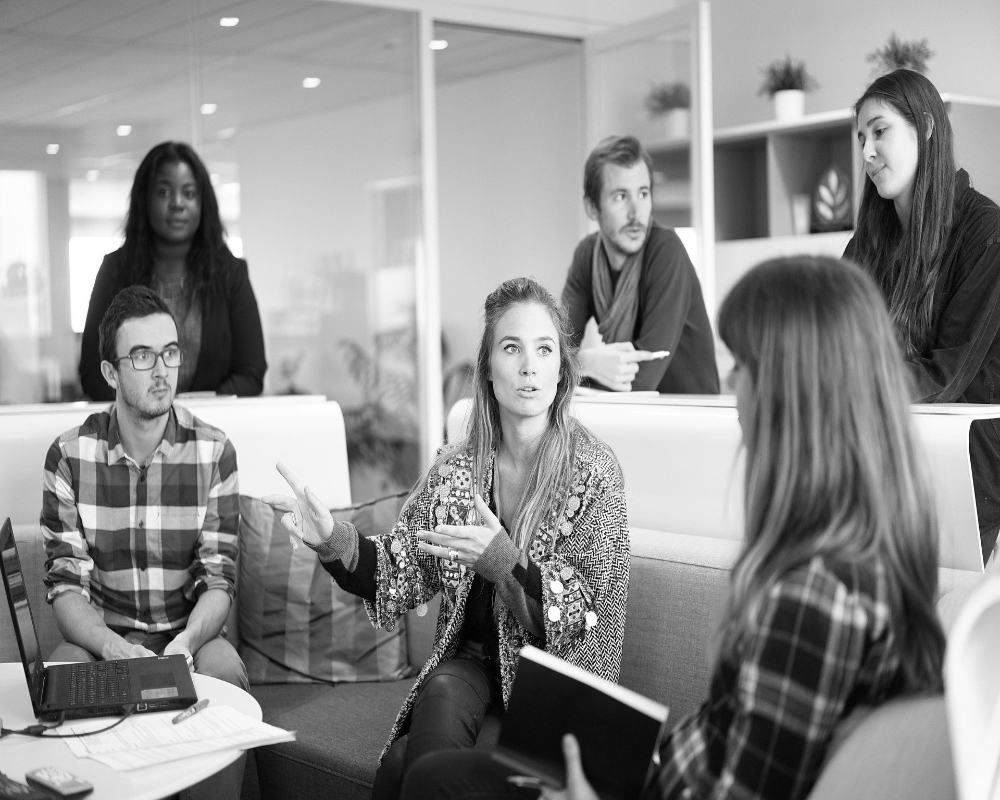

In [8]:
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(image_gray)

In [9]:
print(image_gray.shape)
print(image.shape)

(800, 1000)
(800, 1000, 3)


**Section 2: Haarcascade Algorithm**

In [10]:
face_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/haarcascade_frontalface_default.xml')

In [11]:
detections = face_detector.detectMultiScale(image_gray)

In [12]:
detections

array([[845,  99,  89,  89],
       [144, 167,  65,  65],
       [595, 165,  73,  73],
       [481, 311,  95,  95],
       [114, 320,  85,  85],
       [192, 532,  56,  56]], dtype=int32)

In [13]:
len(detections)

6

*Section 2.1: Face Detection*

845 99 89 89
144 167 65 65
595 165 73 73
481 311 95 95
114 320 85 85
192 532 56 56


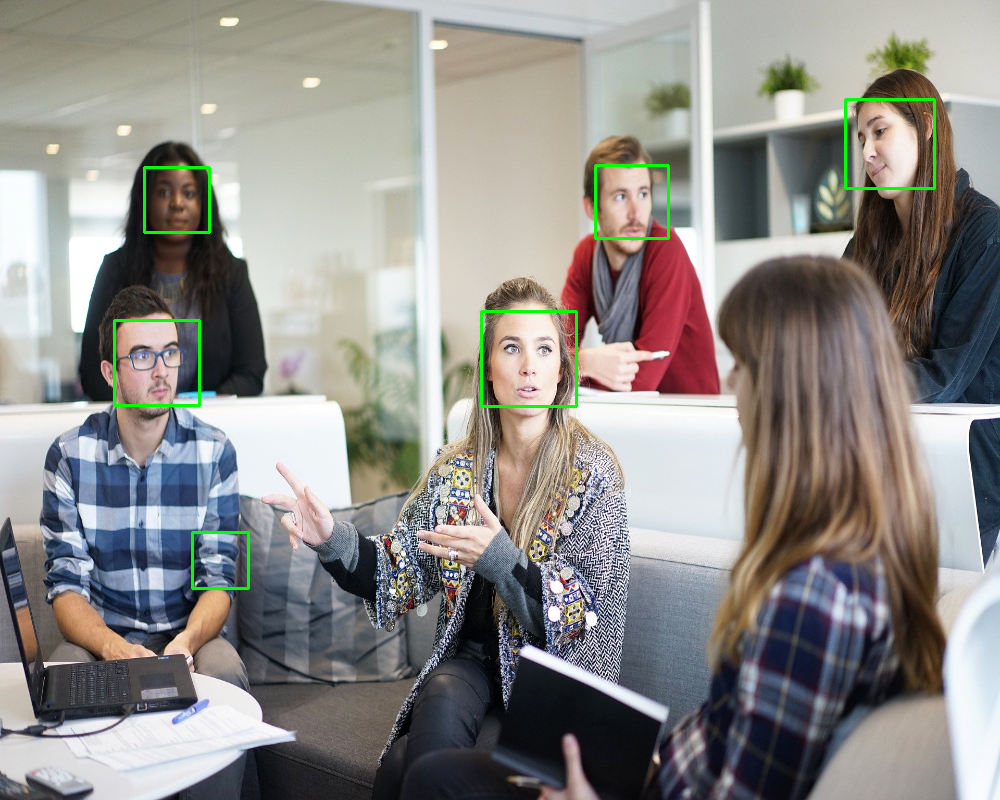

In [14]:

for (x,y,w,h) in detections:
  print(x,y,w,h)
  cv2.rectangle(image, (x,y),(x+w,y+h),(0,255,0),2)
cv2_imshow(image)

In [15]:
detections = face_detector.detectMultiScale(image_gray, scaleFactor = 1.09)

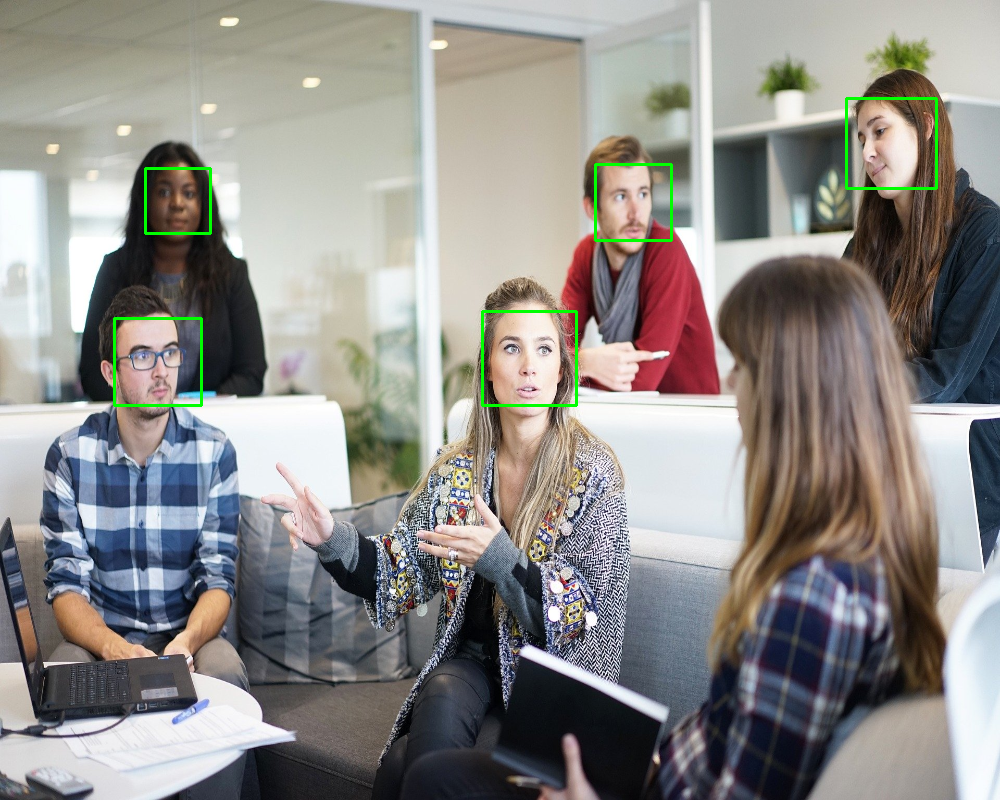

In [16]:
#Fine tuning the algorithm to remove FALSE POSITIVE
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people1.jpg')
image = cv2.resize(image, (1000,800))
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = face_detector.detectMultiScale(image_gray, scaleFactor = 1.13)
for (x,y,w,h) in detections:
  cv2.rectangle(image, (x,y),(x+w,y+h),(0,255,0),2)
cv2_imshow(image)

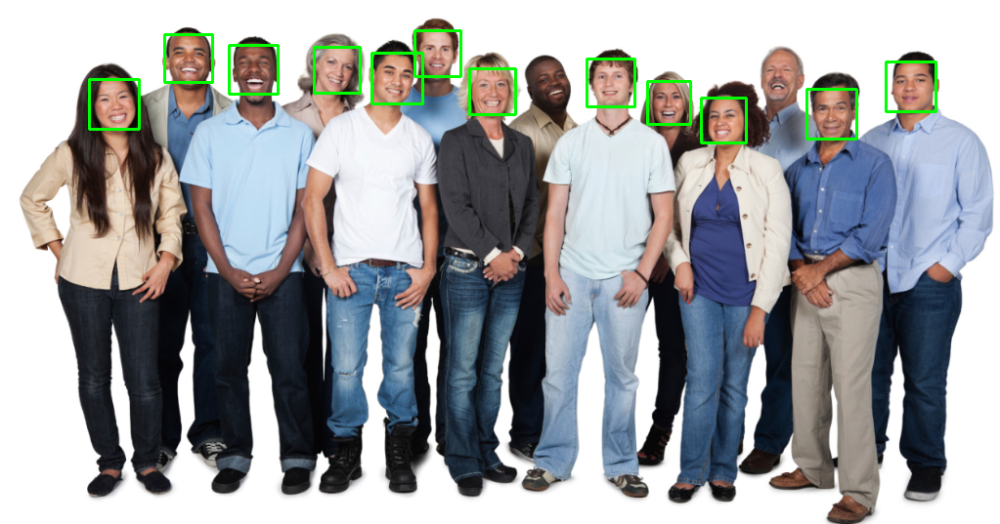

In [17]:
#Testing out another image - notice only 12 out of 14 faces detected

image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people2.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = face_detector.detectMultiScale(image_gray, scaleFactor=1.2, minNeighbors=7)
for (x,y,w,h) in detections:
  cv2.rectangle(image, (x,y),(x+w,y+h),(0,255,0),2)
cv2_imshow(image)

In [18]:
eye_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/haarcascade_eye.xml')

*Section 2.1.1: Eye Detection*

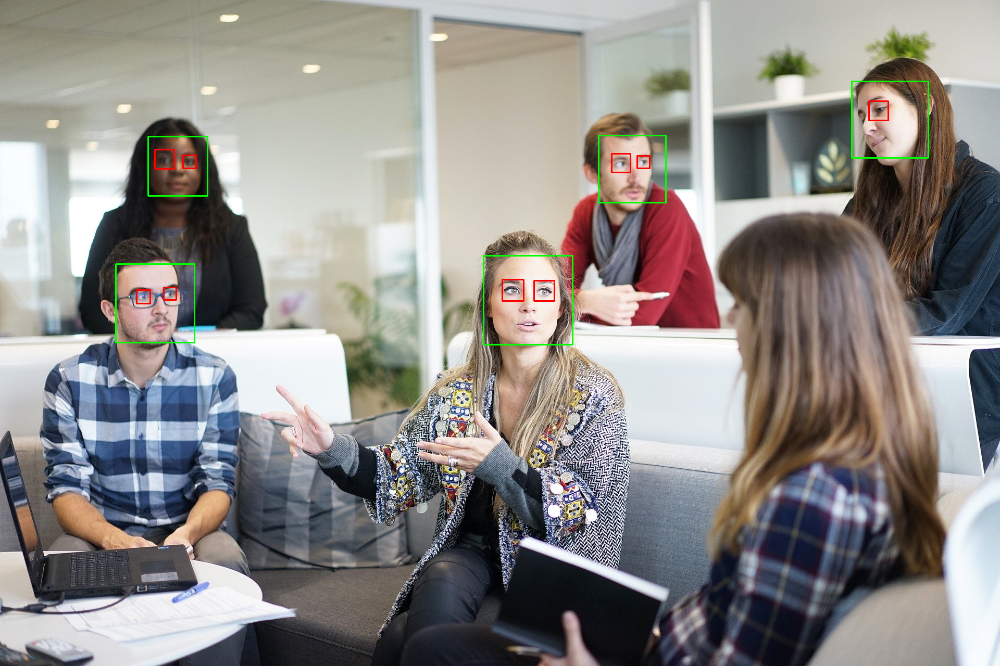

In [19]:
# Fine-tuned the algorithm to detect all the eyes by constantly changing the scaleFactor, minNeighbors, minSize, maxSize

image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people1.jpg')
#image = cv2.resize(image, (800,600))
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

detections = face_detector.detectMultiScale(image_gray, scaleFactor = 1.3, minSize = (30,30))
for (x,y,w,h) in detections:
  cv2.rectangle(image, (x,y),(x+w,y+h),(0,255,0),2)

eye_detections = eye_detector.detectMultiScale(image_gray, scaleFactor = 1.1, minNeighbors = 10, maxSize = (60,60))
for (x,y,w,h) in eye_detections:
  cv2.rectangle(image, (x,y),(x+w,y+h),(0,0,255),2)
cv2_imshow(image)

**Section 2.2: Object Detection**

*Section 2.2.1: Car Detection*

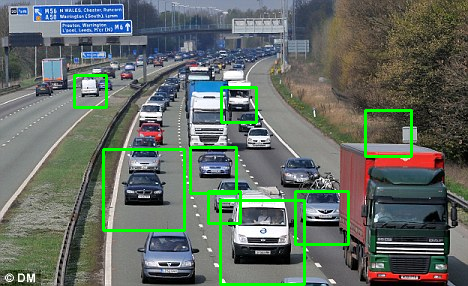

In [20]:
# Only manage to fine-tune to detect 7 cars and 1 false positive

car_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/cars.xml')
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/car.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = car_detector.detectMultiScale(image_gray, scaleFactor=1.03, minNeighbors=5)
for (x,y,w,h) in detections:
  cv2.rectangle(image, (x,y),(x+w,y+h),(0,255,0),2)
cv2_imshow(image)

*Section 2.2.2: Clock Detection*

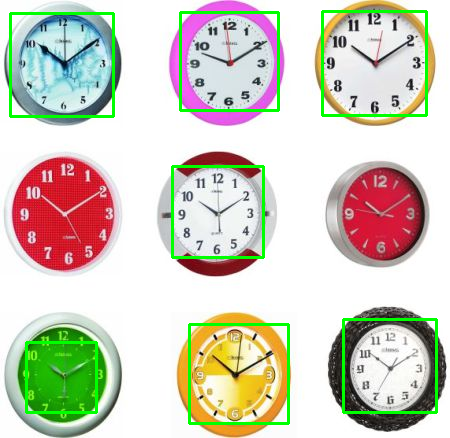

In [21]:
# Only managed to fine-tune to 7 out of 9 clocks 

clock_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/clocks.xml')
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/clock.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = clock_detector.detectMultiScale(image_gray, scaleFactor=1.03, minNeighbors=1)
for (x,y,w,h) in detections:
  cv2.rectangle(image, (x,y),(x+w,y+h),(0,255,0),2)
cv2_imshow(image)

*Section 2.3: Full Body Detection*

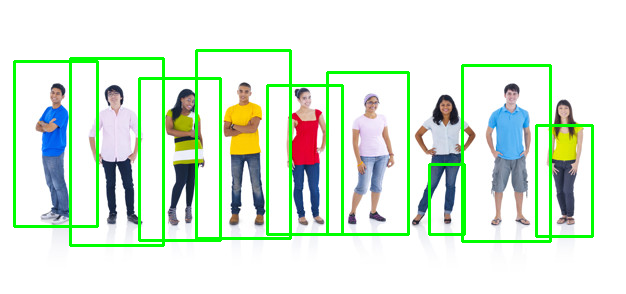

In [22]:
# Was able to detect 7 out of 9 perfectly in the first attempt

full_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/fullbody.xml')
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people3.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = full_detector.detectMultiScale(image_gray, scaleFactor=1.05, minNeighbors = 5)
for (x,y,w,h) in detections:
  cv2.rectangle(image, (x,y),(x+w,y+h),(0,255,0),2)
cv2_imshow(image)

**Section 3: Histogram of Oriented Gradients (HOG) algorithm**

In [23]:
import dlib

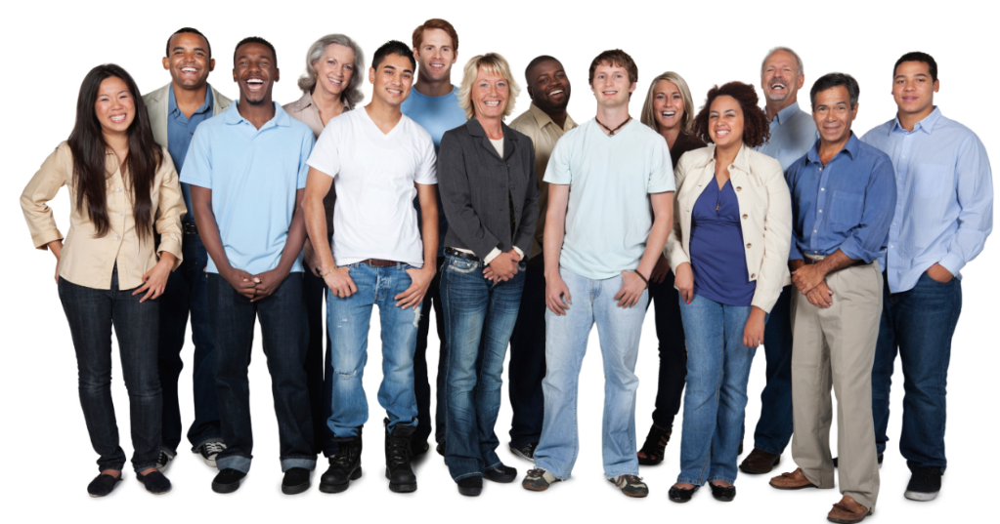

In [24]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people2.jpg')
cv2_imshow(image)

In [25]:
face_detector_hog = dlib.get_frontal_face_detector()

In [26]:
detections = face_detector_hog(image, 1)

In [27]:
detections, len(detections)

(rectangles[[(429, 38) (465, 74)], [(665, 90) (701, 126)], [(717, 103) (760, 146)], [(909, 70) (952, 113)], [(828, 98) (871, 142)], [(605, 70) (641, 106)], [(777, 62) (813, 98)], [(485, 78) (521, 114)], [(386, 60) (429, 103)], [(170, 41) (213, 84)], [(93, 89) (136, 132)], [(237, 50) (280, 94)], [(323, 50) (367, 94)], [(544, 65) (588, 108)]],
 14)

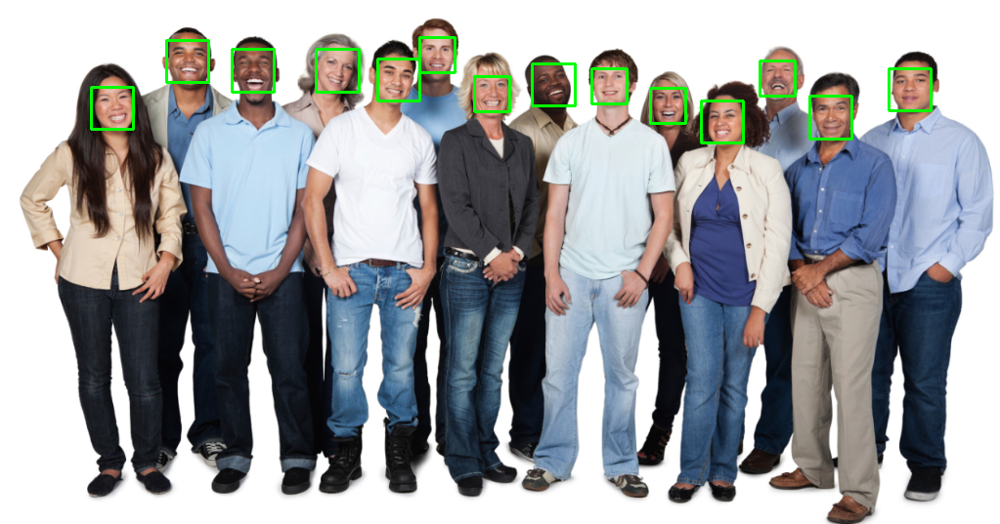

In [28]:
# Detected all 14 faces compared to Haarcascade (12/14)

for face in detections:
  # print(face.left())
  # print(face.top())
  # print(face.right())
  # print(face.bottom())
  l, t, r, b = face.left(), face.top(), face.right(), face.bottom()
  cv2.rectangle(image, (l,t), (r,b), (0,255,0), 2)
cv2_imshow(image)

****

**Section 4: Convolutional Neural Networks (CNN) algorithm**

In [29]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people2.jpg')
cnn_detector = dlib.cnn_face_detection_model_v1('/content/drive/MyDrive/Computer Vision Masterclass/Weights/mmod_human_face_detector.dat')

1.1440614461898804
1.137049913406372
1.1278995275497437
1.1200283765792847
1.1149375438690186
1.1131553649902344
1.0975688695907593
1.0942121744155884
1.085315227508545
1.0801889896392822
1.0800762176513672
1.0784764289855957
1.066403865814209
1.0641791820526123


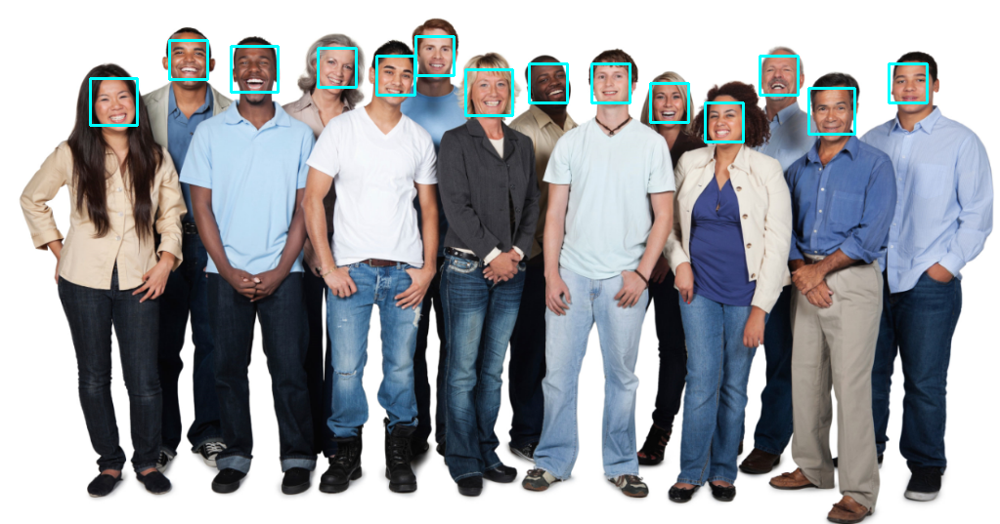

In [30]:
# Detected all 14 faces. Greatest accuracy 

detections = cnn_detector(image, 1)
for face in detections:
  l, t, r, b, c = face.rect.left(), face.rect.top(), face.rect.right(), face.rect.bottom(), face.confidence
  print(c)
  cv2.rectangle(image, (l,t),(r,b),(255,255,0),2)
cv2_imshow(image)

**Section 5: Haarcascade vs HOG vs CNN**

*Section 5.1: Haarcascade*


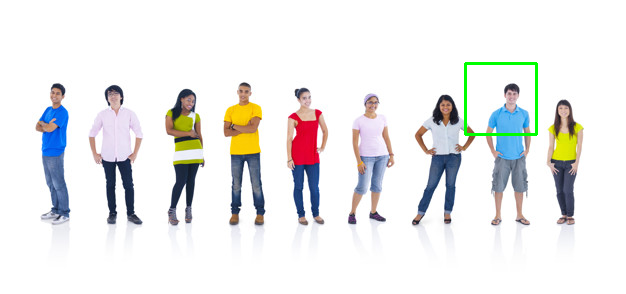

In [31]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people3.jpg')
image_gray= cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
haarcascade_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/haarcascade_frontalface_default.xml')
detections = haarcascade_detector.detectMultiScale(image_gray, scaleFactor=1.001, minNeighbors = 5, minSize = (5,5))
for (x, y, w, h) in detections:
  cv2.rectangle(image, (x,y),(x + w, y + h),(0,255,0),2)
cv2_imshow(image)

*Section 5.2: HOG*

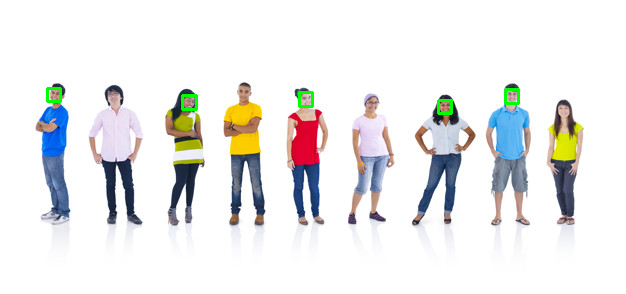

In [34]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people3.jpg')
face_detector_hog = dlib.get_frontal_face_detector()
detections = face_detector_hog(image, 4)
for face in detections:
  l, t, r, b = (face.left(), face.top(), face.right(), face.bottom())
  cv2.rectangle(image, (l,t),(r,b),(0,255,0),2)
cv2_imshow(image)

*Section 5.3: CNN*

0.4463871121406555
0.08115974068641663


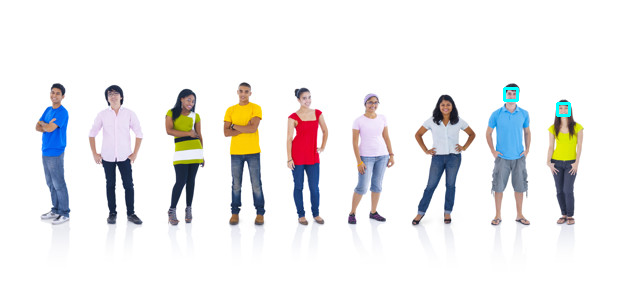

In [36]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people3.jpg')
cnn_detector = dlib.cnn_face_detection_model_v1('/content/drive/MyDrive/Computer Vision Masterclass/Weights/mmod_human_face_detector.dat')
detections = cnn_detector(image, 4)
for face in detections:
  l, t, r, b, c = face.rect.left(), face.rect.top(), face.rect.right(), face.rect.bottom(), face.confidence
  print(c)
  cv2.rectangle(image, (l,t),(r,b),(255,255,0),2)
cv2_imshow(image)

**Section 6: Conclusion**

Although CNN is the most accurate one from all the algorithms demonstrated, HOG performed the best in the last example from section 5. 

* HOG: 5/9 

* CNN: 2/9

* Haarcascade: 1/9 (not accurate)